# 1. Libararies

In [113]:
import sys
import pandas as pd
import numpy as np
import matplotlib
import tqdm as tq
import sktime  # 시계열 데이터 다루기 위한 라이브러리
import xgboost as xgb
import seaborn as sns
import sklearn as skl

print("-------------------------- Python & library version --------------------------")
print(f"Python version: {sys.version}")
print(f"pandas version: {pd.__version__}")
print(f"numpy version: {np.__version__}")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"tqdm version: {tq.__version__}")
print(f"sktime version: {sktime.__version__}")
print(f"xgboost version: {xgb.__version__}")
print(f"seaborn version: {sns.__version__}")
print(f"scikit-learn version: {skl.__version__}")
print("------------------------------------------------------------------------------")

-------------------------- Python & library version --------------------------
Python version: 3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]
pandas version: 1.5.3
numpy version: 1.23.5
matplotlib version: 3.7.0
tqdm version: 4.64.1
sktime version: 0.21.0
xgboost version: 1.7.6
seaborn version: 0.12.2
scikit-learn version: 1.2.1
------------------------------------------------------------------------------


In [114]:
import matplotlib.pyplot as plt
from tqdm import tqdm # progress bar 
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

pd.set_option('display.max_columns', 30)

# warning 제거
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=UserWarning)

# 2. preprocessing data

In [115]:
train = pd.read_csv('./data/train.csv')
train

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40
...,...,...,...,...,...,...,...,...,...,...
203995,100_20220824 19,100,20220824 19,23.1,NaN,0.9,86.0,0.5,NaN,881.04
203996,100_20220824 20,100,20220824 20,22.4,NaN,1.3,86.0,0.0,NaN,798.96
203997,100_20220824 21,100,20220824 21,21.3,NaN,1.0,92.0,NaN,NaN,825.12
203998,100_20220824 22,100,20220824 22,21.0,NaN,0.3,94.0,NaN,NaN,640.08


In [116]:
test = pd.read_csv('./data/test.csv')
test

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%)
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77
...,...,...,...,...,...,...,...
16795,100_20220831 19,100,20220831 19,22.5,0.0,0.9,84
16796,100_20220831 20,100,20220831 20,20.7,0.0,0.4,95
16797,100_20220831 21,100,20220831 21,20.2,0.0,0.4,98
16798,100_20220831 22,100,20220831 22,20.1,0.0,1.1,97


In [117]:
building = pd.read_csv('./data/building_info.csv')
building

,건물번호,건물유형,연면적(m2),냉방면적(m2),태양광용량(kW),ESS저장용량(kWh),PCS용량(kW)
0,1,건물기타,110634.00,39570.00,-,-,-
1,2,건물기타,122233.47,99000.00,-,-,-
2,3,건물기타,171243.00,113950.00,40,-,-
3,4,건물기타,74312.98,34419.62,60,-,-
4,5,건물기타,205884.00,150000.00,-,2557,1000
...,...,...,...,...,...,...,...
95,96,호텔및리조트,93314.00,60500.00,-,-,-
96,97,호텔및리조트,55144.67,25880.00,-,-,-
97,98,호텔및리조트,53578.62,17373.75,-,-,-
98,99,호텔및리조트,53499.00,40636.00,-,-,-


In [118]:
# 건물번호 2번만 모델링해서 확인
y = train.loc[train.건물번호 == 2, '전력소비량(kWh)']
x = train.loc[train.건물번호 == 2].iloc[:,:-1]

In [119]:
# num_date_time 추출
import re

def extract_parts(value):
    pattern = r'(\d+)_([0-9]{8})\s(\d{2})'

    match = re.match(pattern, value)
    if match:
        number = int(match.group(1))
        date = pd.to_datetime(match.group(2), format='%Y%m%d')
        time = int(match.group(3))
        return number, date, time
    else:
        return None, None, None


In [120]:
# 정규 표현식을 이용한 number, date, time 추출

x['number'], x['date'], x['time'] = zip(*x['num_date_time'].apply(extract_parts))

x = x.drop(columns=['num_date_time'])

In [121]:
# date 특성 분리

x['year'] = x['date'].dt.year
x['month'] = x['date'].dt.month
x['day'] = x['date'].dt.day
x['day_of_week'] = x['date'].dt.dayofweek  # Monday=0, Sunday=6
x['day_of_year'] = x['date'].dt.dayofyear
x['quarter'] = x['date'].dt.quarter

x = x.drop(columns=['date'])

In [122]:
x = x.drop(columns=['일시', 'year'])

In [123]:
x

,건물번호,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),number,time,month,day,day_of_week,day_of_year,quarter
2040,2,18.6,NaN,0.9,42.0,NaN,NaN,2,0,6,1,2,152,2
2041,2,18.0,NaN,1.1,45.0,NaN,NaN,2,1,6,1,2,152,2
2042,2,17.7,NaN,1.5,45.0,NaN,NaN,2,2,6,1,2,152,2
2043,2,16.7,NaN,1.4,48.0,NaN,NaN,2,3,6,1,2,152,2
2044,2,18.4,NaN,2.8,43.0,NaN,NaN,2,4,6,1,2,152,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4075,2,25.5,NaN,2.9,63.0,0.1,0.19,2,19,8,24,2,236,3
4076,2,25.0,NaN,2.6,66.0,0.0,0.01,2,20,8,24,2,236,3
4077,2,24.6,NaN,1.3,67.0,NaN,NaN,2,21,8,24,2,236,3
4078,2,24.1,NaN,2.1,70.0,NaN,NaN,2,22,8,24,2,236,3


In [124]:
y

2040    1170.36
2041    1146.96
2042    1115.28
2043    1107.00
2044    1069.92
         ...   
4075    1866.96
4076    1693.80
4077    1564.92
4078     948.96
4079    1348.92
Name: 전력소비량(kWh), Length: 2040, dtype: float64

train data shape
x:(1872, 14), y:(1872,)


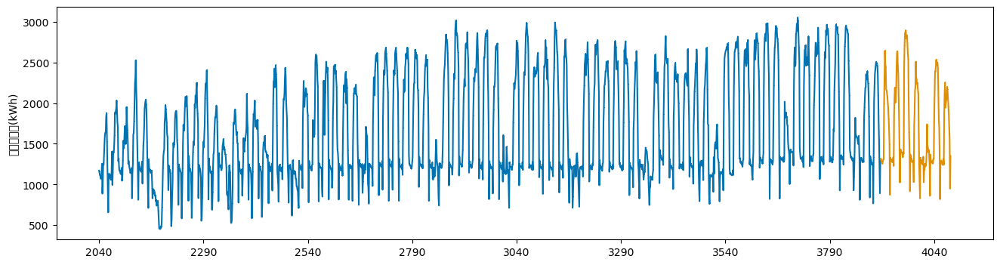

In [125]:
# 시계열 데이터 split
y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print(f'train data shape\nx:{x_train.shape}, y:{y_train.shape}')

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [126]:
x_train

,건물번호,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),number,time,month,day,day_of_week,day_of_year,quarter
2040,2,18.6,NaN,0.9,42.0,NaN,NaN,2,0,6,1,2,152,2
2041,2,18.0,NaN,1.1,45.0,NaN,NaN,2,1,6,1,2,152,2
2042,2,17.7,NaN,1.5,45.0,NaN,NaN,2,2,6,1,2,152,2
2043,2,16.7,NaN,1.4,48.0,NaN,NaN,2,3,6,1,2,152,2
2044,2,18.4,NaN,2.8,43.0,NaN,NaN,2,4,6,1,2,152,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3907,2,27.3,NaN,2.6,67.0,0.2,0.25,2,19,8,17,2,229,3
3908,2,26.5,NaN,1.7,72.0,0.0,0.02,2,20,8,17,2,229,3
3909,2,25.7,NaN,1.5,75.0,NaN,NaN,2,21,8,17,2,229,3
3910,2,25.0,NaN,2.2,77.0,NaN,NaN,2,22,8,17,2,229,3


In [127]:
y_train

2040    1170.36
2041    1146.96
2042    1115.28
2043    1107.00
2044    1069.92
         ...   
3907    1779.12
3908    1553.04
3909    1216.08
3910     891.36
3911    1303.92
Name: 전력소비량(kWh), Length: 1872, dtype: float64

# 3. XGboost

In [128]:
# Define SMAPE loss function

def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

print(f"SMAPE when underestimated to 50  when actual value is 100: {SMAPE(100, 50)}")
print(f"SMAPE when overestimating to 150 when actual value is 100: {SMAPE(100, 150)}")
print()
print(f"SMAPE when underestimated to 10   when actual value is 100: {SMAPE(100, 10)}")
print(f"SMAPE when overestimating to 1000 when actual value is 100: {SMAPE(100, 1000)}")


SMAPE when underestimated to 50  when actual value is 100: 33.33333333333333
SMAPE when overestimating to 150 when actual value is 100: 20.0

SMAPE when underestimated to 10   when actual value is 100: 81.81818181818183
SMAPE when overestimating to 1000 when actual value is 100: 81.81818181818183


In [129]:
# 기존 mse 보다 과소추정을 alpha로 보정하는 custom loss function
# alpha도 튜닝이 필요함

def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

In [130]:
xgb_reg = XGBRegressor(
    base_score=0.5,
    booster='gbtree',
    colsample_bylevel=1,
    colsample_bynode=1,
    colsample_bytree=0.8,
    eta=0.01,
    gamma=0,
    gpu_id=-1,
    importance_type='gain',
    interaction_constraints='',
    learning_rate=0.001,
    max_delta_step=0,
    max_depth=5,
    min_child_weight=6,
    missing=np.nan,  # Replace with the appropriate value for missing data
    monotone_constraints='()',
    n_estimators=10000,
    n_jobs=-1,
    num_parallel_tree=1,
    random_state=0,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    seed=0,
    subsample=0.9,
    tree_method='exact',
    validate_parameters=1,
    verbosity=None
)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.01,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy=None, importance_type='gain',
             interaction_constraints='', learning_rate=0.001, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=0,
             max_depth=5, max_leaves=None, min_child_weight=6, missing=nan,
             monotone_constraints='()', n_estimators=10000, n_jobs=-1,
             num_parallel_tree=1, predictor=None, ...)

best iterations: 9946
SMAPE: 4.278817581558268


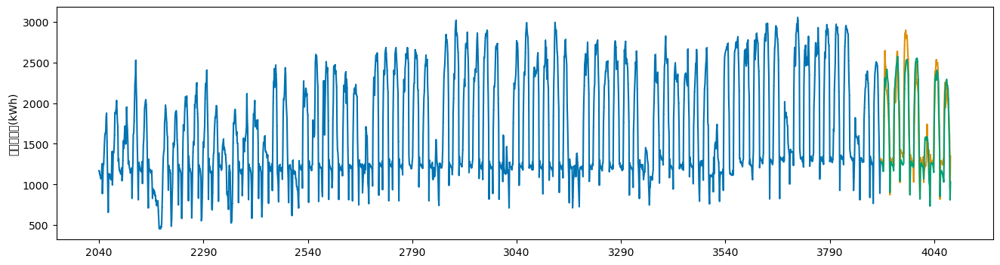

In [131]:
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print(f'best iterations: {xgb_reg.best_iteration}')
print(f'SMAPE: {SMAPE(y_valid, pred)}')

In [132]:
xgb_reg = XGBRegressor(
    base_score=0.5,
    booster='gbtree',
    colsample_bylevel=1,
    colsample_bynode=1,
    colsample_bytree=0.8,
    eta=0.01,
    gamma=0,
    gpu_id=-1,
    importance_type='gain',
    interaction_constraints='',
    learning_rate=0.001,
    max_delta_step=0,
    max_depth=5,
    min_child_weight=6,
    missing=np.nan,  # Replace with the appropriate value for missing data
    monotone_constraints='()',
    n_estimators=10000,
    n_jobs=-1,
    num_parallel_tree=1,
    random_state=0,
    reg_alpha=0,
    reg_lambda=1,
    scale_pos_weight=1,
    seed=0,
    subsample=0.9,
    tree_method='exact',
    validate_parameters=1,
    verbosity=None
)

xgb_reg.set_params(**{'objective':weighted_mse(100)})

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.01,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy=None, importance_type='gain',
             interaction_constraints='', learning_rate=0.001, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=0,
             max_depth=5, max_leaves=None, min_child_weight=6, missing=nan,
             monotone_constraints='()', n_estimators=10000, n_jobs=-1,
             num_parallel_tree=1,
             objective=<function weighted_mse.<locals>.weighted_mse_fixed at 0x000001F8343B1900>, ...)

best iterations: 2719
SMAPE: 5.37897513465638


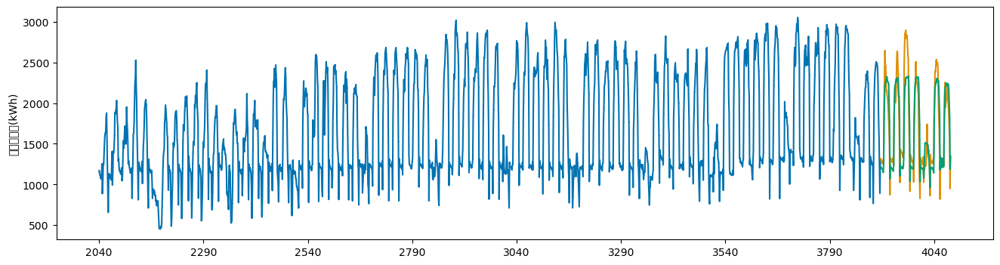

In [133]:
## SMAPE custom function
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print(f'best iterations: {xgb_reg.best_iteration}')
print(f'SMAPE: {SMAPE(y_valid, pred)}')

# hyperparam tune

In [ ]:
train

In [ ]:
# train 데이터 정리

train['number'], train['date'], train['time'] = zip(*train['num_date_time'].apply(extract_parts))

train = train.drop(columns=['num_date_time'])

# Date features separation
train['year'] = train['date'].dt.year
train['month'] = train['date'].dt.month
train['day'] = train['date'].dt.day
train['day_of_week'] = train['date'].dt.dayofweek  # Monday=0, Sunday=6
train['day_of_year'] = train['date'].dt.dayofyear
train['quarter'] = train['date'].dt.quarter

train = train.drop(columns=['date'])
train = train.drop(columns=['일시', 'year'])
train = train.drop(columns=['일조(hr)', '일사(MJ/m2)'])

In [ ]:
# 전력 소비량 위치 변경
# 전력 소비량을 제외한 col 위치를 조절하고 마지막에 전력 소비량 위치
train = train[[col for col in train.columns if col != '전력소비량(kWh)'] + ['전력소비량(kWh)']]

train

In [ ]:
# cpu run time : 46m
from sklearn.metrics import make_scorer
smape = make_scorer(SMAPE, greater_is_better = False)

from sklearn.model_selection import PredefinedSplit, GridSearchCV
df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1), 
        'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1), 
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)
        
for i in tqdm(np.arange(1, 101)):
    y = train.loc[train.건물번호 == i, '전력소비량(kWh)']
    x = train.loc[train.건물번호 == i].iloc[:, :-1]
    
    pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator=XGBRegressor(seed=0, tree_method='auto', predictor='cpu_predictor'),
                       param_grid=grid, scoring=smape, cv=3, refit=True, verbose=True)

    gcv.fit(x, y)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x)
    building = 'building' + str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./hyperparameter_xgb.csv', index=False)  # save the tuned parameters

In [ ]:
# ## gpu 가속 속도 체크 필요
# # 73m
# from sklearn.metrics import make_scorer
# smape = make_scorer(SMAPE, greater_is_better = False)

# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1), 
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1), 
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)
        
# for i in tqdm(np.arange(1, 101)):
#     y = train.loc[train.건물번호 == i, '전력소비량(kWh)']
#     x = train.loc[train.건물번호 == i].iloc[:, :-1]
    
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 0, 
#                                                 tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                        param_grid = grid, scoring = smape, cv = pds, refit = True, verbose = True)
    
#     gcv.fit(x, y)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

In [ ]:
xgb_params = pd.read_csv('./hyperparameter_xgb.csv')

In [ ]:
xgb_params

In [ ]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train.loc[train.건물번호 == i + 1, '전력소비량(kWh)']
    x = train.loc[train.건물번호 == i + 1].iloc[:, :-1]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=0)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

In [ ]:
alpha_list = []
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.건물번호 == i + 1, '전력소비량(kWh)']
    x = train.loc[train.건물번호 == i + 1].iloc[:, :-1]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

In [ ]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [8, 8], color = 'red')

In [ ]:
# test 데이터 정리

test['number'], test['date'], test['time'] = zip(*test['num_date_time'].apply(extract_parts))

test = test.drop(columns=['num_date_time'])

# Date features separation
test['year'] = test['date'].dt.year
test['month'] = test['date'].dt.month
test['day'] = test['date'].dt.day
test['day_of_week'] = test['date'].dt.dayofweek  # Monday=0, Sunday=6
test['day_of_year'] = test['date'].dt.dayofyear
test['quarter'] = test['date'].dt.quarter

test = test.drop(columns=['date'])
test = test.drop(columns=['일시', 'year'])
test

In [ ]:
x_train = train.loc[train.건물번호 == 1, ].iloc[:, 3:]

In [ ]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head(20)

In [ ]:
preds = np.array([]) 
for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    for seed in [1,3,5]: # 각 시드별 예측
        y_train = train.loc[train.건물번호 == i+1, '전력소비량(kWh)']
        x_train, x_test = train.loc[train.건물번호 == i+1].iloc[:, :-1], test.loc[test.건물번호 == i+1]
        x_test = x_test[x_train.columns]
         
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.01, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
        if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)   

In [ ]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,400), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.건물번호 == i+1, '전력소비량(kWh)'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.건물번호 == i+1, '전력소비량(kWh)'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.show()

In [1]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission_xgb_noclip.csv', index = False)

NameError: name 'pd' is not defined

# post processsing

In [75]:
import re
def extract_parts(value):
    pattern = r'(\d+)_([0-9]{8})\s(\d{2})'

    match = re.match(pattern, value)
    if match:
        number = int(match.group(1))
        date = pd.to_datetime(match.group(2), format='%Y%m%d')
        time = int(match.group(3))
        return number, date, time
    else:
        return None, None, None

In [76]:
train_post = pd.read_csv('./data/train.csv')

train_post['number'], train_post['date'], train_post['time'] = zip(*train_post['num_date_time'].apply(extract_parts))

train_post = train_post.drop(columns=['num_date_time'])

# Date features separation
train_post['year'] = train_post['date'].dt.year
train_post['month'] = train_post['date'].dt.month
train_post['day'] = train_post['date'].dt.day
train_post['day_of_week'] = train_post['date'].dt.dayofweek  # Monday=0, Sunday=6
train_post['day_of_year'] = train_post['date'].dt.dayofyear
train_post['quarter'] = train_post['date'].dt.quarter

train_post = train_post.drop(columns=['date'])
train_post = train_post.drop(columns=['일시', 'year'])
train_post = train_post.drop(columns=['일조(hr)', '일사(MJ/m2)'])

train_post

,건물번호,기온(C),강수량(mm),풍속(m/s),습도(%),전력소비량(kWh),number,time,month,day,day_of_week,day_of_year,quarter
0,1,18.6,NaN,0.9,42.0,1085.28,1,0,6,1,2,152,2
1,1,18.0,NaN,1.1,45.0,1047.36,1,1,6,1,2,152,2
2,1,17.7,NaN,1.5,45.0,974.88,1,2,6,1,2,152,2
3,1,16.7,NaN,1.4,48.0,953.76,1,3,6,1,2,152,2
4,1,18.4,NaN,2.8,43.0,986.40,1,4,6,1,2,152,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,23.1,NaN,0.9,86.0,881.04,100,19,8,24,2,236,3
203996,100,22.4,NaN,1.3,86.0,798.96,100,20,8,24,2,236,3
203997,100,21.3,NaN,1.0,92.0,825.12,100,21,8,24,2,236,3
203998,100,21.0,NaN,0.3,94.0,640.08,100,22,8,24,2,236,3


In [77]:
test_post = pd.read_csv('./data/test.csv')

test_post['number'], test_post['date'], test_post['time'] = zip(*test_post['num_date_time'].apply(extract_parts))

test_post = test_post.drop(columns=['num_date_time'])

# Date features separation
test_post['year'] = test_post['date'].dt.year
test_post['month'] = test_post['date'].dt.month
test_post['day'] = test_post['date'].dt.day
test_post['day_of_week'] = test_post['date'].dt.dayofweek  # Monday=0, Sunday=6
test_post['day_of_year'] = test_post['date'].dt.dayofyear
test_post['quarter'] = test_post['date'].dt.quarter

test_post = test_post.drop(columns=['date'])
test_post = test_post.drop(columns=['일시', 'year'])

test_post

,건물번호,기온(C),강수량(mm),풍속(m/s),습도(%),number,time,month,day,day_of_week,day_of_year,quarter
0,1,23.5,0.0,2.2,72,1,0,8,25,3,237,3
1,1,23.0,0.0,0.9,72,1,1,8,25,3,237,3
2,1,22.7,0.0,1.5,75,1,2,8,25,3,237,3
3,1,22.1,0.0,1.3,78,1,3,8,25,3,237,3
4,1,21.8,0.0,1.0,77,1,4,8,25,3,237,3
...,...,...,...,...,...,...,...,...,...,...,...,...
16795,100,22.5,0.0,0.9,84,100,19,8,31,2,243,3
16796,100,20.7,0.0,0.4,95,100,20,8,31,2,243,3
16797,100,20.2,0.0,0.4,98,100,21,8,31,2,243,3
16798,100,20.1,0.0,1.1,97,100,22,8,31,2,243,3


In [93]:
min_consumption_df = train_post.groupby('건물번호')['전력소비량(kWh)'].min().reset_index()
min_consumption_df

,건물번호,전력소비량(kWh)
0,1,773.76
1,2,452.52
2,3,711.00
3,4,444.96
4,5,1031.76
...,...,...
95,96,1328.52
96,97,487.44
97,98,319.68
98,99,513.36


In [135]:
pred_clip = pd.DataFrame()

# Loop over buildings
for i in range(100):
    df = pd.read_csv('./submission_xgb_noclip.csv')
    power = min_consumption_df.loc[min_consumption_df.건물번호 == i + 1, '전력소비량(kWh)'].values[0]
    building_df = df.iloc[24 * 7 * i: 24 * 7 * (i + 1)].copy()
    
    # Replace 'answer' column values with power if they are lower
    building_df['answer'] = building_df['answer'].apply(lambda x: x if x >= power else power)
    
    # Concatenate building_df to pred_clip
    pred_clip = pd.concat([pred_clip, building_df])

# Reset the index of pred_clip
pred_clip.reset_index(drop=True, inplace=True)

# Print the concatenated DataFrame
print(pred_clip)

         num_date_time       answer
0        1_20220825 00  1950.407715
1        1_20220825 01  1930.105835
2        1_20220825 02  1811.978149
3        1_20220825 03  1782.939453
4        1_20220825 04  1782.369141
...                ...          ...
16795  100_20220831 19   995.531311
16796  100_20220831 20   896.751892
16797  100_20220831 21   835.595398
16798  100_20220831 22   748.148926
16799  100_20220831 23   625.492249

[16800 rows x 2 columns]


In [136]:
df = pd.read_csv('./submission_xgb_noclip.csv')
df

,num_date_time,answer
0,1_20220825 00,1950.407715
1,1_20220825 01,1930.105835
2,1_20220825 02,1811.978149
3,1_20220825 03,1782.939453
4,1_20220825 04,1782.369141
...,...,...
16795,100_20220831 19,995.531311
16796,100_20220831 20,896.751892
16797,100_20220831 21,835.595398
16798,100_20220831 22,748.148926


In [137]:
differences = df['answer'] - pred_clip['answer']

# Add the differences as a new column to the df DataFrame
df['differences'] = differences
sum_differences = df['differences'].sum()

print(df)
print("Sum of differences:", sum_differences)

         num_date_time       answer  differences
0        1_20220825 00  1950.407715          0.0
1        1_20220825 01  1930.105835          0.0
2        1_20220825 02  1811.978149          0.0
3        1_20220825 03  1782.939453          0.0
4        1_20220825 04  1782.369141          0.0
...                ...          ...          ...
16795  100_20220831 19   995.531311          0.0
16796  100_20220831 20   896.751892          0.0
16797  100_20220831 21   835.595398          0.0
16798  100_20220831 22   748.148926          0.0
16799  100_20220831 23   625.492249          0.0

[16800 rows x 3 columns]
Sum of differences: -666.9486132812495


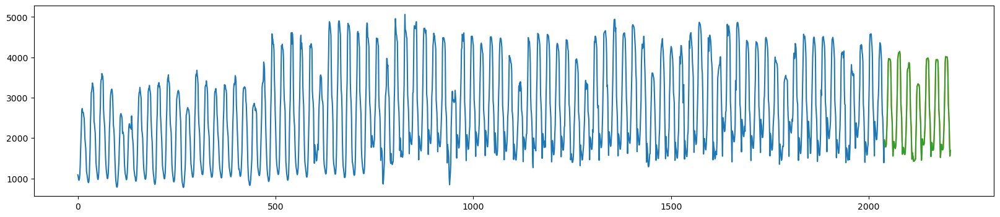

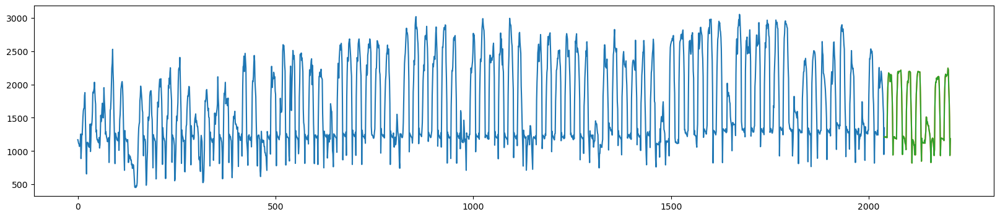

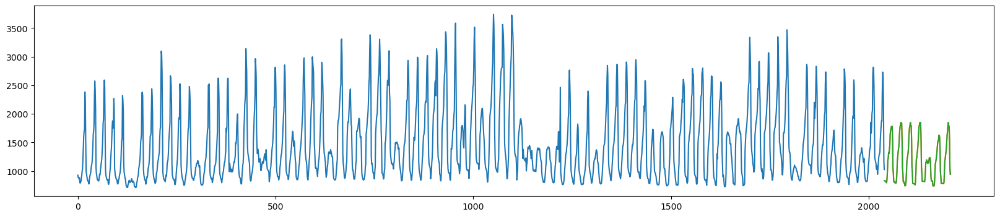

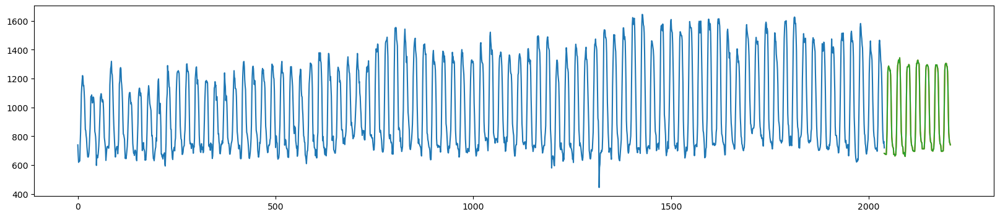

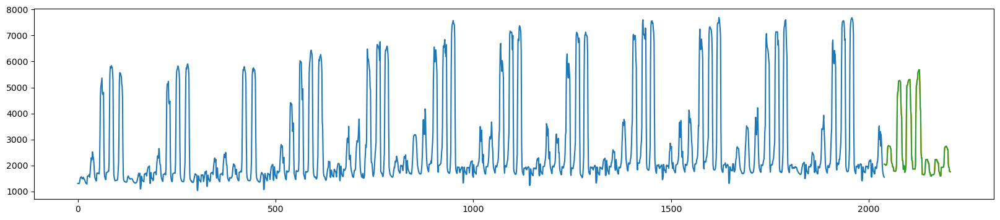

...

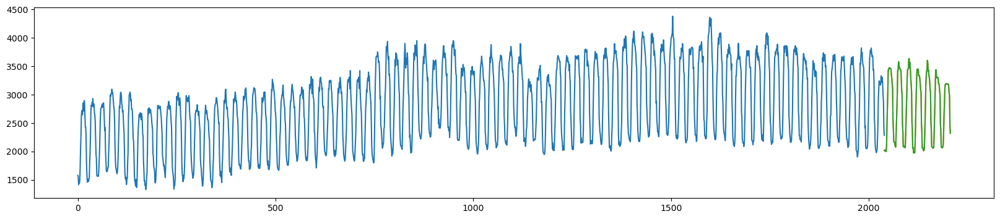

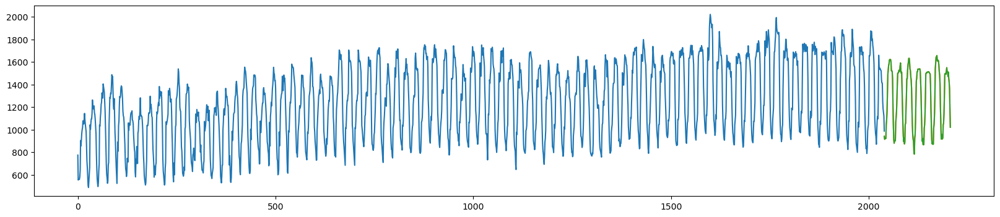

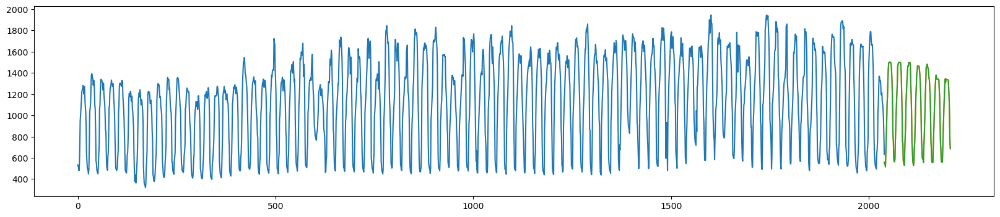

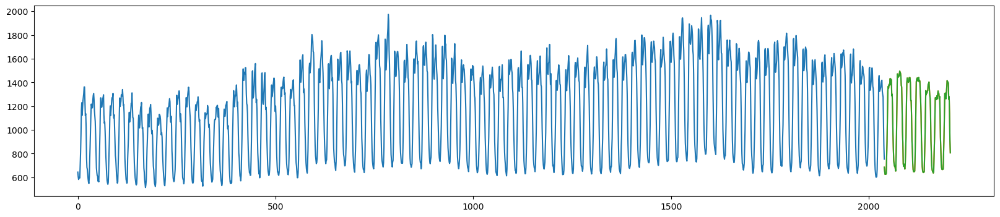

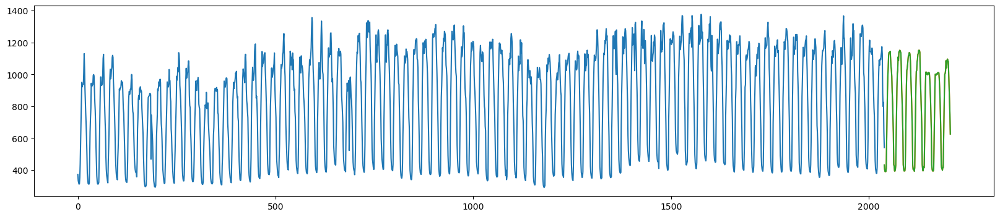

In [106]:
pred_origin = df.answer
pred_clip = pred_clip.answer

for i in range(100):
    power = train_post.loc[train_post.건물번호 == i+1, '전력소비량(kWh)'].reset_index(drop=True)
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds = pred_clip[i*168:(i+1)*168]

    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    preds.index = range(power.index[-1], power.index[-1]+168)
    
    plt.figure(figsize=(20, 4))
    plt.plot(power, label='power', marker='')
    plt.plot(preds_origin, label='preds_origin', marker='')
    plt.plot(preds, label='preds', marker='')
    plt.show()